Snscrape is used for scraping information from Twitter that does not require the use of an API.  
Snscrape allows you to scrape basic information such as a user's profile, tweet content, source, and so on.

In [1]:
pip install snscrape

In [2]:
pip install Pyppeteer

Note: you may need to restart the kernel to use updated packages.


A word cloud is a visual representation of information or data. It shows the popularity of words or phrases by making the most frequently used words appear larger or bolder compared with the other words around them.

In [3]:
pip install wordcloud

Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install vaderSentiment

Note: you may need to restart the kernel to use updated packages.


In [5]:
pip install gensim

Note: you may need to restart the kernel to use updated packages.


In [7]:
pip install -U nltk

  Attempting uninstall: nltk
    Found existing installation: nltk 3.7
    Uninstalling nltk-3.7:
      Successfully uninstalled nltk-3.7
Note: you may need to restart the kernel to use updated packages.


In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

import snscrape.modules.twitter as sntwitter
from wordcloud import WordCloud
from nltk.tokenize import TweetTokenizer
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

#for text pre-processing
import nltk
import re, string #Regular Expression
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.corpus import wordnet
from nltk.stem import SnowballStemmer
from nltk.stem import WordNetLemmatizer

nltk.download('punkt')
nltk.download('average_perceptron_tagger')
nltk.download('wordnet')

#bag of words
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer

#for word embedding
import gensim
from gensim.models import Word2Vec
#Word2Vec is mostly used for huge datasets

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\randa\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping tokenizers\punkt.zip.
[nltk_data] Error loading average_perceptron_tagger: Package
[nltk_data]     'average_perceptron_tagger' not found in index
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\randa\AppData\Roaming\nltk_data...


In [8]:
# creating list to append tweet data
tweet_c1 = []

#using sncraper to scrape data & append tweets to the list
for i,tweet in enumerate(sntwitter.TwitterSearchScraper('#joebiden since:2020-04-01 until:2020-10-31').get_items()):
    if i>50000:
        break
    tweet_c1.append([tweet.likeCount, tweet.retweetCount, tweet.user.username, tweet.date, tweet.content])

#creating a dataframe to load the list
tweets_df1 = pd.DataFrame(tweet_c1, columns=["Like_count", "Retweet_count", "Username", "Date", "Tweet"])



# creating list to append tweet data for Donald trump
tweet_c2 = []

#using sncraper to scrape data & append tweets to the list
for i,tweet in enumerate(sntwitter.TwitterSearchScraper('#donaldtrump since:2020-04-01 until:2020-10-31').get_items()):
    if i>50000:
        break
    tweet_c2.append([tweet.likeCount, tweet.retweetCount, tweet.user.username, tweet.date, tweet.content])

#creating a dataframe to load the list
tweets_df2 = pd.DataFrame(tweet_c2, columns=["Like_count", "Retweet_count", "Username", "Date", "Tweet"])

In [9]:
tweets_df1.to_csv('JoeBiden_rawtweets.csv', encoding = 'utf-8')

In [10]:
tweets_df2.to_csv('DonaldTrump_rawtweets.csv', encoding = 'utf-8')

In [11]:
tweets_df1 = pd.read_csv('JoeBiden_rawtweets.csv')

In [12]:
tweets_df2 = pd.read_csv('DonaldTrump_rawtweets.csv')

--------------------------------------------------------------------------------------------------------------------------------

In [13]:
tweets_df1.head()

,Unnamed: 0,Like_count,Retweet_count,Username,Date,Tweet
0,0,0,0,RalphLCampbell1,2020-10-30 23:59:31+00:00,Rosie Perez On Latino Vote: ‘We Have The Power...
1,1,0,0,masquer08er,2020-10-30 23:59:14+00:00,@goywithaploy3 @RNCResearch @MelissaTweets I s...
2,2,4,2,SusanBChurch11,2020-10-30 23:58:17+00:00,I’m ready to see a great president! #JoeBiden...
3,3,0,0,nkolmer,2020-10-30 23:58:12+00:00,Let’s talk abt how screwed up you @potus have ...
4,4,0,0,SAJi74436184,2020-10-30 23:58:11+00:00,@realDonaldTrump Dear America. A quick remind...


In [14]:
tweets_df2.head()

,Unnamed: 0,Like_count,Retweet_count,Username,Date,Tweet
0,0,1,0,DanLake87324031,2020-10-30 23:59:41+00:00,#DonaldTrump #TeamTrump Republican officials a...
1,1,1,0,social411now,2020-10-30 23:59:13+00:00,How #DonaldTrump Plans to Overthrow #AmericanD...
2,2,0,0,2g_shah,2020-10-30 23:59:08+00:00,"The Supreme Court has used ""Shadow Docket"" 14 ..."
3,3,0,0,JoeCool212,2020-10-30 23:58:51+00:00,@PalmerReport Stevie can SEE 👀 #VOTEHIMOUT @PO...
4,4,0,0,DecalogoOficial,2020-10-30 23:58:46+00:00,"#VotoX\nRevela Trump si plan del ""sueño americ..."


In [15]:
print('Total number of records in Joe Biden dataset: ', tweets_df1.shape)
print('Total number of records in Donald Trump dataset: ', tweets_df2.shape)

Total number of records in Joe Biden dataset:  (50001, 6)
Total number of records in Donald Trump dataset:  (50001, 6)


In [16]:
tweets_df1.columns

Index(['Unnamed: 0', 'Like_count', 'Retweet_count', 'Username', 'Date',
       'Tweet'],
      dtype='object')

In [17]:
tweets_df2.columns

Index(['Unnamed: 0', 'Like_count', 'Retweet_count', 'Username', 'Date',
       'Tweet'],
      dtype='object')

Remove the tweets having both #joebiden and #donaldtrump

In [18]:
common_datetime = set(tweets_df1.Date).intersection(set(tweets_df2.Date))
len(common_datetime)

6639

There are 6639 tweets that share have both #joebiden & #donaldtrump

In [22]:
Joe_df = tweets_df1[~tweets_df1['Date'].isin(common_datetime)]
Trump_df = tweets_df2[~tweets_df2['Date'].isin(common_datetime)]

In [23]:
Joe_df

,Unnamed: 0,Like_count,Retweet_count,Username,Date,Tweet
0,0,0,0,RalphLCampbell1,2020-10-30 23:59:31+00:00,Rosie Perez On Latino Vote: ‘We Have The Power...
1,1,0,0,masquer08er,2020-10-30 23:59:14+00:00,@goywithaploy3 @RNCResearch @MelissaTweets I s...
2,2,4,2,SusanBChurch11,2020-10-30 23:58:17+00:00,I’m ready to see a great president! #JoeBiden...
3,3,0,0,nkolmer,2020-10-30 23:58:12+00:00,Let’s talk abt how screwed up you @potus have ...
4,4,0,0,SAJi74436184,2020-10-30 23:58:11+00:00,@realDonaldTrump Dear America. A quick remind...
...,...,...,...,...,...,...
49996,49996,0,0,SKUsa11,2020-10-21 15:08:32+00:00,#JoeBiden Unveils Powerful New Ad Featuring On...
49997,49997,1,0,PeterDawsonUSA,2020-10-21 15:08:29+00:00,What did #HunterBiden mean in this message whe...
49998,49998,0,0,hardcoreminimo,2020-10-21 15:08:21+00:00,@JoeBiden @RealJamesWoods @realDonaldTrump #Jo...
49999,49999,0,1,PeterDawsonUSA,2020-10-21 15:08:04+00:00,@ChuckRossDC @JimDeMint What did #HunterBiden ...


In [24]:
Joe_df.reset_index(inplace=True)

In [25]:
Joe_df

,index,Unnamed: 0,Like_count,Retweet_count,Username,Date,Tweet
0,0,0,0,0,RalphLCampbell1,2020-10-30 23:59:31+00:00,Rosie Perez On Latino Vote: ‘We Have The Power...
1,1,1,0,0,masquer08er,2020-10-30 23:59:14+00:00,@goywithaploy3 @RNCResearch @MelissaTweets I s...
2,2,2,4,2,SusanBChurch11,2020-10-30 23:58:17+00:00,I’m ready to see a great president! #JoeBiden...
3,3,3,0,0,nkolmer,2020-10-30 23:58:12+00:00,Let’s talk abt how screwed up you @potus have ...
4,4,4,0,0,SAJi74436184,2020-10-30 23:58:11+00:00,@realDonaldTrump Dear America. A quick remind...
...,...,...,...,...,...,...,...
42356,49996,49996,0,0,SKUsa11,2020-10-21 15:08:32+00:00,#JoeBiden Unveils Powerful New Ad Featuring On...
42357,49997,49997,1,0,PeterDawsonUSA,2020-10-21 15:08:29+00:00,What did #HunterBiden mean in this message whe...
42358,49998,49998,0,0,hardcoreminimo,2020-10-21 15:08:21+00:00,@JoeBiden @RealJamesWoods @realDonaldTrump #Jo...
42359,49999,49999,0,1,PeterDawsonUSA,2020-10-21 15:08:04+00:00,@ChuckRossDC @JimDeMint What did #HunterBiden ...


In [26]:
Trump_df.reset_index(inplace=True)

In [27]:
Trump_df

,index,Unnamed: 0,Like_count,Retweet_count,Username,Date,Tweet
0,0,0,1,0,DanLake87324031,2020-10-30 23:59:41+00:00,#DonaldTrump #TeamTrump Republican officials a...
1,1,1,1,0,social411now,2020-10-30 23:59:13+00:00,How #DonaldTrump Plans to Overthrow #AmericanD...
2,2,2,0,0,2g_shah,2020-10-30 23:59:08+00:00,"The Supreme Court has used ""Shadow Docket"" 14 ..."
3,3,3,0,0,JoeCool212,2020-10-30 23:58:51+00:00,@PalmerReport Stevie can SEE 👀 #VOTEHIMOUT @PO...
4,4,4,0,0,DecalogoOficial,2020-10-30 23:58:46+00:00,"#VotoX\nRevela Trump si plan del ""sueño americ..."
...,...,...,...,...,...,...,...
43032,49996,49996,1,0,editorji,2020-10-09 04:26:14+00:00,Trump's campaign team proposes new dates for t...
43033,49997,49997,9,0,Capernico,2020-10-09 04:26:12+00:00,Ahí andamos como pendejos tapándonos el hocico...
43034,49998,49998,0,0,OffTopicTim,2020-10-09 04:26:03+00:00,Think of #DonaldTrump &amp; the #Republicans a...
43035,49999,49999,0,0,ActorDeborah,2020-10-09 04:25:47+00:00,"@RepGregMurphy @KamalaHarris Promises Made, Pr..."


In [30]:
Joe_df = Joe_df.drop(['index','Unnamed: 0'], axis=1)
Joe_df.head()

,Like_count,Retweet_count,Username,Date,Tweet
0,0,0,RalphLCampbell1,2020-10-30 23:59:31+00:00,Rosie Perez On Latino Vote: ‘We Have The Power...
1,0,0,masquer08er,2020-10-30 23:59:14+00:00,@goywithaploy3 @RNCResearch @MelissaTweets I s...
2,4,2,SusanBChurch11,2020-10-30 23:58:17+00:00,I’m ready to see a great president! #JoeBiden...
3,0,0,nkolmer,2020-10-30 23:58:12+00:00,Let’s talk abt how screwed up you @potus have ...
4,0,0,SAJi74436184,2020-10-30 23:58:11+00:00,@realDonaldTrump Dear America. A quick remind...


In [31]:
Trump_df = Trump_df.drop(['index','Unnamed: 0'], axis=1)
Trump_df.head()

,Like_count,Retweet_count,Username,Date,Tweet
0,1,0,DanLake87324031,2020-10-30 23:59:41+00:00,#DonaldTrump #TeamTrump Republican officials a...
1,1,0,social411now,2020-10-30 23:59:13+00:00,How #DonaldTrump Plans to Overthrow #AmericanD...
2,0,0,2g_shah,2020-10-30 23:59:08+00:00,"The Supreme Court has used ""Shadow Docket"" 14 ..."
3,0,0,JoeCool212,2020-10-30 23:58:51+00:00,@PalmerReport Stevie can SEE 👀 #VOTEHIMOUT @PO...
4,0,0,DecalogoOficial,2020-10-30 23:58:46+00:00,"#VotoX\nRevela Trump si plan del ""sueño americ..."


In [32]:
pip install langdetect

  Created wheel for langdetect: filename=langdetect-1.0.9-py3-none-any.whl size=993242 sha256=6653f5b57b8f29e73bafcf42e86f57446d838d6b31d164cf29f05b6a0e32e595
  Stored in directory: c:\users\randa\appdata\local\pip\cache\wheels\d1\c1\d9\7e068de779d863bc8f8fc9467d85e25cfe47fa5051fff1a1bb
Successfully built langdetect
Note: you may need to restart the kernel to use updated packages.


In [33]:
import langdetect
from langdetect import detect

Language detection algorithm is non-deterministic, which means that if you try to run it on a text which is either too short or too ambiguous, you might get different results everytime you run it.

To enforce consistent results we'll call following code before the first language detection:

In [34]:
from langdetect import DetectorFactory
DetectorFactory.seed = 0

In [43]:
#test 1 
print(Joe_df.iloc[42000,4])
detect(Joe_df.iloc[42000,4])

You forgot to deny the emails #JoeBiden.  Where is @SavannahGuthrie when you need her to badger someone with a question in rapid &amp;  rabid succession..🐕

Biden breaks silence on Hunter's laptop and Giuliani 'smear' effort https://t.co/Rbb7P5Q5QI via @MailOnline


'en'

In [44]:
#defining a function to detect language

def get_language(tweet):
    try:
        lang=detect(tweet)
    except:
        lang='no'
        #for some tweets, the detect function will throw an error.
    return lang

In [45]:
Joe_df['lang'] = Joe_df.Tweet.apply(lambda x:get_language(x))
Trump_df['lang'] = Trump_df.Tweet.apply(lambda x:get_language(x))

In [47]:
Joe_df.head()

,Like_count,Retweet_count,Username,Date,Tweet,lang
0,0,0,RalphLCampbell1,2020-10-30 23:59:31+00:00,Rosie Perez On Latino Vote: ‘We Have The Power...,en
1,0,0,masquer08er,2020-10-30 23:59:14+00:00,@goywithaploy3 @RNCResearch @MelissaTweets I s...,en
2,4,2,SusanBChurch11,2020-10-30 23:58:17+00:00,I’m ready to see a great president! #JoeBiden...,en
3,0,0,nkolmer,2020-10-30 23:58:12+00:00,Let’s talk abt how screwed up you @potus have ...,en
4,0,0,SAJi74436184,2020-10-30 23:58:11+00:00,@realDonaldTrump Dear America. A quick remind...,en


In [51]:
Joe_df['lang'].value_counts()

en       34254
nl        4077
es        1199
de         692
fr         275
da         266
af         260
no         237
id         161
fi         138
pt         125
sv         105
it          83
ca          77
ta          60
tr          59
ro          45
et          29
ja          24
hi          23
kn          21
mr          21
el          13
pl          12
so          11
hr           9
fa           9
ur           8
cy           8
sl           8
te           7
vi           4
gu           4
cs           4
ar           4
zh-tw        3
tl           3
ru           3
sw           3
th           3
ko           2
bn           2
hu           2
ml           2
pa           2
he           1
sk           1
lv           1
zh-cn        1
Name: lang, dtype: int64

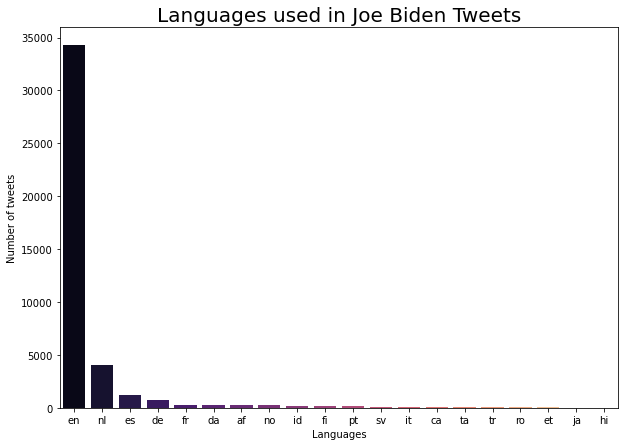

In [73]:
plt.figure(figsize=(10,7))
sns.barplot(Joe_df['lang'].value_counts()[:20].index,Joe_df['lang'].value_counts()[:20].values, palette='magma')
plt.title('Languages used in Joe Biden Tweets', fontsize=20)
plt.xlabel('Languages')
plt.ylabel('Number of tweets')
plt.show()

In [58]:
Trump_df.head()

,Like_count,Retweet_count,Username,Date,Tweet,lang
0,1,0,DanLake87324031,2020-10-30 23:59:41+00:00,#DonaldTrump #TeamTrump Republican officials a...,en
1,1,0,social411now,2020-10-30 23:59:13+00:00,How #DonaldTrump Plans to Overthrow #AmericanD...,en
2,0,0,2g_shah,2020-10-30 23:59:08+00:00,"The Supreme Court has used ""Shadow Docket"" 14 ...",en
3,0,0,JoeCool212,2020-10-30 23:58:51+00:00,@PalmerReport Stevie can SEE 👀 #VOTEHIMOUT @PO...,en
4,0,0,DecalogoOficial,2020-10-30 23:58:46+00:00,"#VotoX\nRevela Trump si plan del ""sueño americ...",es


In [62]:
Trump_df['lang'].value_counts()

en       33463
es        2695
ro         971
fr         857
de         613
id         494
tr         481
hi         424
pt         341
nl         336
it         280
ta         277
ca         195
ml         179
te         170
da         130
gu         105
kn         101
bn          79
ur          75
sv          71
ja          66
mr          63
pl          63
af          62
no          60
hr          58
et          47
ar          45
pa          25
fa          22
fi          22
tl          21
hu          19
ne          19
el          16
th          14
ru          13
lt          13
vi           8
sw           8
sl           7
so           6
cs           4
zh-tw        4
lv           3
zh-cn        3
bg           3
ko           2
sk           2
he           1
cy           1
Name: lang, dtype: int64

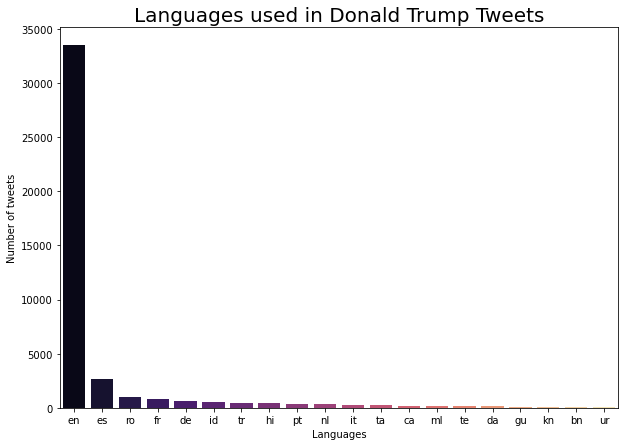

In [76]:
plt.figure(figsize=(10,7))
sns.barplot(Trump_df['lang'].value_counts()[:20].index,Trump_df['lang'].value_counts()[:20].values, palette='magma')
plt.title('Languages used in Donald Trump Tweets', fontsize=20)
plt.xlabel('Languages')
plt.ylabel('Number of tweets')
plt.show()

In [77]:
Joe_df_eng = Joe_df[Joe_df.lang=='en']
Trump_df_eng = Trump_df[Trump_df.lang=='en']

In [80]:
print('Total number of records in Joe Biden dataset that are English : ', Joe_df_eng.shape)
print('Total number of records in Donald Trump dataset that are English : ', Trump_df_eng.shape)

Total number of records in Joe Biden dataset that are English :  (34254, 6)
Total number of records in Donald Trump dataset that are English :  (33463, 6)


In [81]:
# Exporting the New datasets

Joe_df_eng.to_csv('Joe_BeforeTextPreprocessing.csv', encoding = 'utf-8')
Trump_df_eng.to_csv('Trump_BeforeTextPreprocessing.csv', encoding = 'utf-8')

In [82]:
Joe_df_eng.reset_index(inplace=True)
Trump_df_eng.reset_index(inplace=True)

In [84]:
Joe_df_eng

,index,Like_count,Retweet_count,Username,Date,Tweet,lang
0,0,0,0,RalphLCampbell1,2020-10-30 23:59:31+00:00,Rosie Perez On Latino Vote: ‘We Have The Power...,en
1,1,0,0,masquer08er,2020-10-30 23:59:14+00:00,@goywithaploy3 @RNCResearch @MelissaTweets I s...,en
2,2,4,2,SusanBChurch11,2020-10-30 23:58:17+00:00,I’m ready to see a great president! #JoeBiden...,en
3,3,0,0,nkolmer,2020-10-30 23:58:12+00:00,Let’s talk abt how screwed up you @potus have ...,en
4,4,0,0,SAJi74436184,2020-10-30 23:58:11+00:00,@realDonaldTrump Dear America. A quick remind...,en
...,...,...,...,...,...,...,...
34249,42355,0,0,mort_twain,2020-10-21 15:08:38+00:00,Rudy has been very quiet regarding his hard dr...,en
34250,42356,0,0,SKUsa11,2020-10-21 15:08:32+00:00,#JoeBiden Unveils Powerful New Ad Featuring On...,en
34251,42357,1,0,PeterDawsonUSA,2020-10-21 15:08:29+00:00,What did #HunterBiden mean in this message whe...,en
34252,42358,0,0,hardcoreminimo,2020-10-21 15:08:21+00:00,@JoeBiden @RealJamesWoods @realDonaldTrump #Jo...,en


In [85]:
Trump_df_eng

,index,Like_count,Retweet_count,Username,Date,Tweet,lang
0,0,1,0,DanLake87324031,2020-10-30 23:59:41+00:00,#DonaldTrump #TeamTrump Republican officials a...,en
1,1,1,0,social411now,2020-10-30 23:59:13+00:00,How #DonaldTrump Plans to Overthrow #AmericanD...,en
2,2,0,0,2g_shah,2020-10-30 23:59:08+00:00,"The Supreme Court has used ""Shadow Docket"" 14 ...",en
3,3,0,0,JoeCool212,2020-10-30 23:58:51+00:00,@PalmerReport Stevie can SEE 👀 #VOTEHIMOUT @PO...,en
4,5,1,0,Revivingfortune,2020-10-30 23:58:40+00:00,@realDonaldTrump Terrible week on the #StockM...,en
...,...,...,...,...,...,...,...
33458,43031,0,0,ActorDeborah,2020-10-09 04:26:29+00:00,@RepGregMurphy @KamalaHarris #DonaldTrump Trum...,en
33459,43032,1,0,editorji,2020-10-09 04:26:14+00:00,Trump's campaign team proposes new dates for t...,en
33460,43034,0,0,OffTopicTim,2020-10-09 04:26:03+00:00,Think of #DonaldTrump &amp; the #Republicans a...,en
33461,43035,0,0,ActorDeborah,2020-10-09 04:25:47+00:00,"@RepGregMurphy @KamalaHarris Promises Made, Pr...",en


In [86]:
Joe_df_eng = Joe_df_eng.drop(['index'], axis=1)
Trump_df_eng = Trump_df_eng.drop(['index'], axis=1)

In [87]:
Joe_df_eng

,Like_count,Retweet_count,Username,Date,Tweet,lang
0,0,0,RalphLCampbell1,2020-10-30 23:59:31+00:00,Rosie Perez On Latino Vote: ‘We Have The Power...,en
1,0,0,masquer08er,2020-10-30 23:59:14+00:00,@goywithaploy3 @RNCResearch @MelissaTweets I s...,en
2,4,2,SusanBChurch11,2020-10-30 23:58:17+00:00,I’m ready to see a great president! #JoeBiden...,en
3,0,0,nkolmer,2020-10-30 23:58:12+00:00,Let’s talk abt how screwed up you @potus have ...,en
4,0,0,SAJi74436184,2020-10-30 23:58:11+00:00,@realDonaldTrump Dear America. A quick remind...,en
...,...,...,...,...,...,...
34249,0,0,mort_twain,2020-10-21 15:08:38+00:00,Rudy has been very quiet regarding his hard dr...,en
34250,0,0,SKUsa11,2020-10-21 15:08:32+00:00,#JoeBiden Unveils Powerful New Ad Featuring On...,en
34251,1,0,PeterDawsonUSA,2020-10-21 15:08:29+00:00,What did #HunterBiden mean in this message whe...,en
34252,0,0,hardcoreminimo,2020-10-21 15:08:21+00:00,@JoeBiden @RealJamesWoods @realDonaldTrump #Jo...,en


In [88]:
Trump_df_eng

,Like_count,Retweet_count,Username,Date,Tweet,lang
0,1,0,DanLake87324031,2020-10-30 23:59:41+00:00,#DonaldTrump #TeamTrump Republican officials a...,en
1,1,0,social411now,2020-10-30 23:59:13+00:00,How #DonaldTrump Plans to Overthrow #AmericanD...,en
2,0,0,2g_shah,2020-10-30 23:59:08+00:00,"The Supreme Court has used ""Shadow Docket"" 14 ...",en
3,0,0,JoeCool212,2020-10-30 23:58:51+00:00,@PalmerReport Stevie can SEE 👀 #VOTEHIMOUT @PO...,en
4,1,0,Revivingfortune,2020-10-30 23:58:40+00:00,@realDonaldTrump Terrible week on the #StockM...,en
...,...,...,...,...,...,...
33458,0,0,ActorDeborah,2020-10-09 04:26:29+00:00,@RepGregMurphy @KamalaHarris #DonaldTrump Trum...,en
33459,1,0,editorji,2020-10-09 04:26:14+00:00,Trump's campaign team proposes new dates for t...,en
33460,0,0,OffTopicTim,2020-10-09 04:26:03+00:00,Think of #DonaldTrump &amp; the #Republicans a...,en
33461,0,0,ActorDeborah,2020-10-09 04:25:47+00:00,"@RepGregMurphy @KamalaHarris Promises Made, Pr...",en


### Text PreProcessing 

In [95]:
text = 'Preprocess,ing s$#@!*o()&me,. random ##te$x$t t.o re*&m)ove chara#cter^s pun@tu*ation) and lowe#r cas-ing them.'

def preprocess(text):
    cleaned_text = ''
    punctuations = '''!()-[]{};:'"\,<>./?@#$%^&*_~'''
    for i in text:
        if i not in punctuations:
            cleaned_text = cleaned_text + i
            
    return cleaned_text.lower()

preprocess(text)

'preprocessing some random text to remove characters puntuation and lower casing them'

In [96]:
Joe_df_eng['cleaned1'] = Joe_df_eng.Tweet.apply(preprocess)

In [98]:
Trump_df_eng['cleaned1'] = Trump_df_eng.Tweet.apply(preprocess)

In [99]:
Joe_df_eng.head()

,Like_count,Retweet_count,Username,Date,Tweet,lang,cleaned1
0,0,0,RalphLCampbell1,2020-10-30 23:59:31+00:00,Rosie Perez On Latino Vote: ‘We Have The Power...,en,rosie perez on latino vote ‘we have the power ...
1,0,0,masquer08er,2020-10-30 23:59:14+00:00,@goywithaploy3 @RNCResearch @MelissaTweets I s...,en,goywithaploy3 rncresearch melissatweets i stil...
2,4,2,SusanBChurch11,2020-10-30 23:58:17+00:00,I’m ready to see a great president! #JoeBiden...,en,i’m ready to see a great president joebiden i...
3,0,0,nkolmer,2020-10-30 23:58:12+00:00,Let’s talk abt how screwed up you @potus have ...,en,let’s talk abt how screwed up you potus have l...
4,0,0,SAJi74436184,2020-10-30 23:58:11+00:00,@realDonaldTrump Dear America. A quick remind...,en,realdonaldtrump dear america a quick reminder...


In [100]:
Trump_df_eng.head()

,Like_count,Retweet_count,Username,Date,Tweet,lang,cleaned1
0,1,0,DanLake87324031,2020-10-30 23:59:41+00:00,#DonaldTrump #TeamTrump Republican officials a...,en,donaldtrump teamtrump republican officials are...
1,1,0,social411now,2020-10-30 23:59:13+00:00,How #DonaldTrump Plans to Overthrow #AmericanD...,en,how donaldtrump plans to overthrow americandem...
2,0,0,2g_shah,2020-10-30 23:59:08+00:00,"The Supreme Court has used ""Shadow Docket"" 14 ...",en,the supreme court has used shadow docket 14 ti...
3,0,0,JoeCool212,2020-10-30 23:58:51+00:00,@PalmerReport Stevie can SEE 👀 #VOTEHIMOUT @PO...,en,palmerreport stevie can see 👀 votehimout potus...
4,1,0,Revivingfortune,2020-10-30 23:58:40+00:00,@realDonaldTrump Terrible week on the #StockM...,en,realdonaldtrump terrible week on the stockmar...


In [101]:
all_tweets_Joe = ' '.join(tweet for tweet in Joe_df_eng['cleaned1'])
all_tweets_Joe

'rosie perez on latino vote ‘we have the power to change the outcome of  httpstcoyyiecyowov via youtube truth america johnleguizamo rickymartin arod debramessing markruffalo captmarkkelly azdemparty reutersvzla trumpdictatorship wants your oil joebiden aca goywithaploy3 rncresearch melissatweets i still cant figure out what joebiden was going for w trunalimunumaprzure i’m ready to see a great president  joebiden is that president httpstcoz6mpvmsnrb let’s talk abt how screwed up you potus have left our country an out of control pandemic thousands of small businesses closed forebearance coming amp 1000’s evictions joebiden any day of realdonaldtrump screw ups httpstcox9meyvdjuj realdonaldtrump dear america  a quick reminder if your thinking about who to vote for \xa02018   american war herors that died for you at the aisnemarne american cemetery in france were referred to as “losers” and “suckers by your current president   i rest my case joebiden dailycaller according to joebiden “you a

In [102]:
wordcloud_Joe = WordCloud(width=800, height=400, random_state=11, max_font_size=100, collocations=False).generate(all_tweets_Joe)

(-0.5, 799.5, 399.5, -0.5)

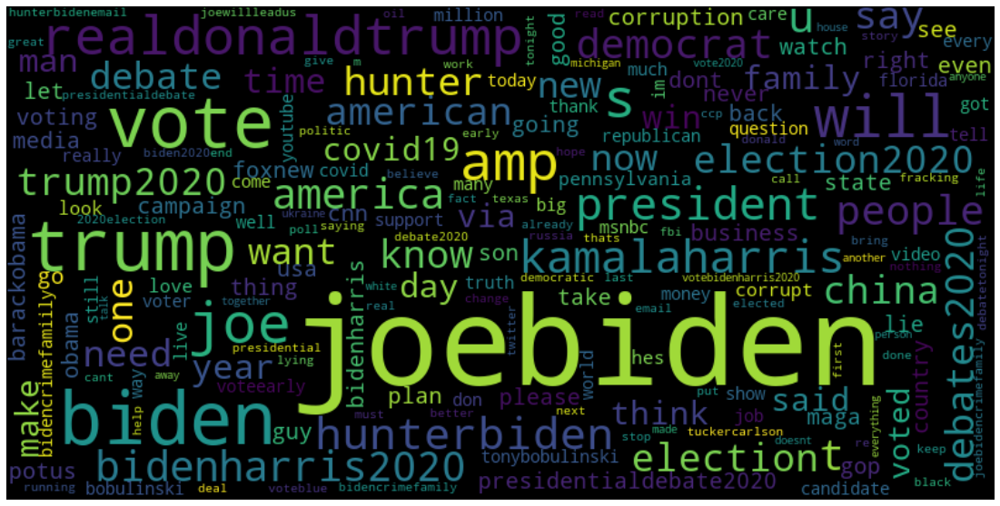

In [103]:
plt.figure(figsize=(20,10))
plt.imshow(wordcloud_Joe, interpolation='bilinear')
plt.axis('off')

In [104]:
all_tweets_Trump = ' '.join(tweets for tweets in Trump_df_eng['cleaned1'])
all_tweets_Trump

'donaldtrump teamtrump republican officials are finally calling out the hatred currently in the white house stating that trump is an embarrassment to the gop and the country and backing biden are you listening realdonaldtrump how donaldtrump plans to overthrow americandemocracy\n\nvotehimout voteearly vote \n\nelection2020 bidenharris2020\n httpstcordkw8ajgj1 the supreme court has used shadow docket 14 times in just october 2019 alone since trumps been president\nsupremecourt \nshadowdocket\nbrettkavanaugh \namyconeybarrett \ntrump \ndonaldtrump \namerican \ngopcorruptionovercountry \ngopbetrayedamerica  httpstcob8npcj7lp4 palmerreport stevie can see 👀 votehimout potus  flotus packyourbags vote2020 trumpisaliar republicants trumpcutsocialsecurity covid19 socialjustice civilunrest protests trumpisaracist badeconomy pooreconomy itstheeconomy voteblue biden byedon donaldtrump buildbackbetter realdonaldtrump  terrible week on the stockmarket  and you donaldtrump are responsible geoffrbenne

In [107]:
wordcloud_Trump = WordCloud(width=800, height=400, random_state=51, collocations=False).generate(all_tweets_Trump)

(-0.5, 799.5, 399.5, -0.5)

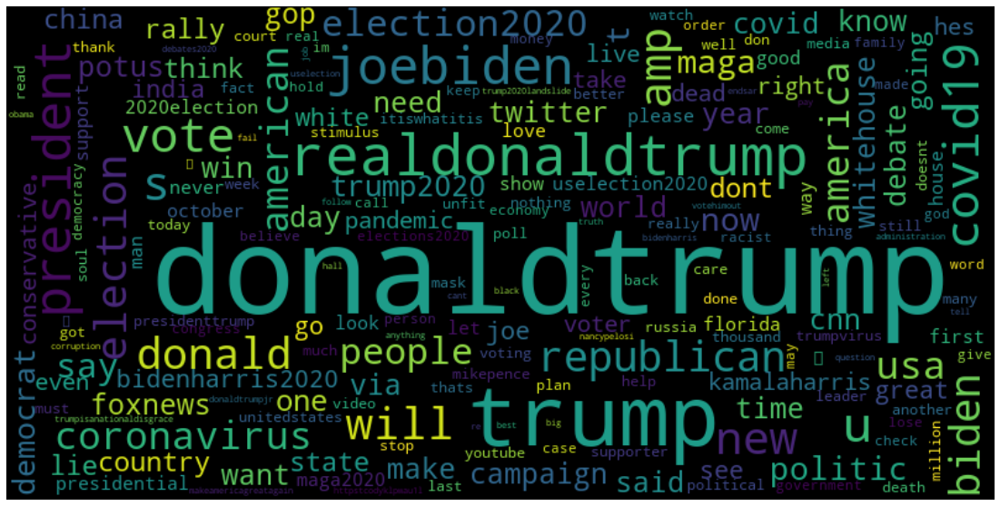

In [108]:
plt.figure(figsize=(20,10))
plt.imshow(wordcloud_Trump, interpolation='bilinear')
plt.axis('off')

### Removing STOP WORDS 
Removing all the stop words like to, the, of, a, etc.

In [122]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\randa\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\stopwords.zip.


True

In [132]:
def stopword(string):
    a = [i for i in string.split() if i not in stopwords.words('english')]
    return ' '.join(a)

#testing
stopword('Max is going out for a walk with the President of USA')

'Max going walk President USA'

### STEMMING 
Keeping only the base/origin of the words.

In [131]:
# Initializing the stemmer
snow = SnowballStemmer('english')

def stemming(string):
    a = [snow.stem(i) for i in word_tokenize(string)]
    return ' '.join(a)

#testing
stemming('beautiful'), stemming('horrifying')

('beauti', 'horrifi')

### LEMMATIZATION 

In [175]:
from nltk import pos_tag
nltk.download('averaged_perceptron_tagger')
nltk.download('omw-1.4')

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\randa\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\randa\AppData\Roaming\nltk_data...


True

In [176]:
# initialize the lemmatizer
wl = WordNetLemmatizer()

# This is a helper function to map NLTK position tags

def get_wordnet_pos(tag):
    if tag.startswith('J'):
        return wordnet.ADJ
    elif tag.startswith('V'):
        return wordnet.VERB
    elif tag.startswith('N'):
        return wordnet.NOUN
    elif tag.startswith('R'):
        return wordnet.ADV
    else:
        return wordnet.NOUN

In [181]:
testing_string = nltk.pos_tag(word_tokenize('my name is nothing and i am flying'))
testing_string

[('my', 'PRP$'),
 ('name', 'NN'),
 ('is', 'VBZ'),
 ('nothing', 'NN'),
 ('and', 'CC'),
 ('i', 'NN'),
 ('am', 'VBP'),
 ('flying', 'VBG')]

In [182]:
for i,j in enumerate(testing_string):
    print(i,j)

0 ('my', 'PRP$')
1 ('name', 'NN')
2 ('is', 'VBZ')
3 ('nothing', 'NN')
4 ('and', 'CC')
5 ('i', 'NN')
6 ('am', 'VBP')
7 ('flying', 'VBG')


In [183]:
# Tokenize the sentence

def lemmatizer(string):
    word_pos_tags = nltk.pos_tag(word_tokenize(string))    #Get the position tag
    a = [ wl.lemmatize(tag[0], get_wordnet_pos(tag[1])) for idx, tag in enumerate(word_pos_tags)]  # map the position tag and lemmatize teh word/token
    return ' '.join(a)

lemmatizer('my name is nothing and i am flying with a beautiful car')

'my name be nothing and i be fly with a beautiful car'

## FINAL PREPROCESSING 

In [184]:
def finalpreprocess(string):
    return lemmatizer(stopword(preprocess(string)))

In [186]:
Joe_df_eng['cleaned_tweets'] = Joe_df_eng['Tweet'].apply(finalpreprocess)
Joe_df_eng

,Like_count,Retweet_count,Username,Date,Tweet,lang,cleaned1,cleaned_tweets
0,0,0,RalphLCampbell1,2020-10-30 23:59:31+00:00,Rosie Perez On Latino Vote: ‘We Have The Power...,en,rosie perez on latino vote ‘we have the power ...,rosie perez latino vote ‘ we power change outc...
1,0,0,masquer08er,2020-10-30 23:59:14+00:00,@goywithaploy3 @RNCResearch @MelissaTweets I s...,en,goywithaploy3 rncresearch melissatweets i stil...,goywithaploy3 rncresearch melissatweets still ...
2,4,2,SusanBChurch11,2020-10-30 23:58:17+00:00,I’m ready to see a great president! #JoeBiden...,en,i’m ready to see a great president joebiden i...,i ’ m ready see great president joebiden presi...
3,0,0,nkolmer,2020-10-30 23:58:12+00:00,Let’s talk abt how screwed up you @potus have ...,en,let’s talk abt how screwed up you potus have l...,let ’ s talk abt screw potus leave country con...
4,0,0,SAJi74436184,2020-10-30 23:58:11+00:00,@realDonaldTrump Dear America. A quick remind...,en,realdonaldtrump dear america a quick reminder...,realdonaldtrump dear america quick reminder th...
...,...,...,...,...,...,...,...,...
34249,0,0,mort_twain,2020-10-21 15:08:38+00:00,Rudy has been very quiet regarding his hard dr...,en,rudy has been very quiet regarding his hard dr...,rudy quiet regard hard drive hell suspect quit...
34250,0,0,SKUsa11,2020-10-21 15:08:32+00:00,#JoeBiden Unveils Powerful New Ad Featuring On...,en,joebiden unveils powerful new ad featuring one...,joebiden unveils powerful new ad feature one a...
34251,1,0,PeterDawsonUSA,2020-10-21 15:08:29+00:00,What did #HunterBiden mean in this message whe...,en,what did hunterbiden mean in this message wher...,hunterbiden mean message claim support entire ...
34252,0,0,hardcoreminimo,2020-10-21 15:08:21+00:00,@JoeBiden @RealJamesWoods @realDonaldTrump #Jo...,en,joebiden realjameswoods realdonaldtrump joebid...,joebiden realjameswoods realdonaldtrump joebid...


In [187]:
Trump_df_eng['cleaned_tweets'] = Trump_df_eng['Tweet'].apply(finalpreprocess)
Trump_df_eng

,Like_count,Retweet_count,Username,Date,Tweet,lang,cleaned1,cleaned_tweets
0,1,0,DanLake87324031,2020-10-30 23:59:41+00:00,#DonaldTrump #TeamTrump Republican officials a...,en,donaldtrump teamtrump republican officials are...,donaldtrump teamtrump republican official fina...
1,1,0,social411now,2020-10-30 23:59:13+00:00,How #DonaldTrump Plans to Overthrow #AmericanD...,en,how donaldtrump plans to overthrow americandem...,donaldtrump plan overthrow americandemocracy v...
2,0,0,2g_shah,2020-10-30 23:59:08+00:00,"The Supreme Court has used ""Shadow Docket"" 14 ...",en,the supreme court has used shadow docket 14 ti...,supreme court use shadow docket 14 time octobe...
3,0,0,JoeCool212,2020-10-30 23:58:51+00:00,@PalmerReport Stevie can SEE 👀 #VOTEHIMOUT @PO...,en,palmerreport stevie can see 👀 votehimout potus...,palmerreport stevie see 👀 votehimout potus flo...
4,1,0,Revivingfortune,2020-10-30 23:58:40+00:00,@realDonaldTrump Terrible week on the #StockM...,en,realdonaldtrump terrible week on the stockmar...,realdonaldtrump terrible week stockmarket dona...
...,...,...,...,...,...,...,...,...
33458,0,0,ActorDeborah,2020-10-09 04:26:29+00:00,@RepGregMurphy @KamalaHarris #DonaldTrump Trum...,en,repgregmurphy kamalaharris donaldtrump trump’s...,repgregmurphy kamalaharris donaldtrump trump ’...
33459,1,0,editorji,2020-10-09 04:26:14+00:00,Trump's campaign team proposes new dates for t...,en,trumps campaign team proposes new dates for th...,trump campaign team propose new date next pres...
33460,0,0,OffTopicTim,2020-10-09 04:26:03+00:00,Think of #DonaldTrump &amp; the #Republicans a...,en,think of donaldtrump amp the republicans as a ...,think donaldtrump amp republicans spoil entitl...
33461,0,0,ActorDeborah,2020-10-09 04:25:47+00:00,"@RepGregMurphy @KamalaHarris Promises Made, Pr...",en,repgregmurphy kamalaharris promises made promi...,repgregmurphy kamalaharris promise make promis...


### TOKENIZATION 

In [188]:
tweet_tokenizer = TweetTokenizer()

In [189]:
Joe_df_eng['cleaned_tweets_token'] = Joe_df_eng['cleaned_tweets'].apply(tweet_tokenizer.tokenize)

In [190]:
Joe_df_eng['cleaned_tweets_token'] = [', '.join(map(str, token)) for token in Joe_df_eng['cleaned_tweets_token']]

In [191]:
Joe_df_eng.head()

,Like_count,Retweet_count,Username,Date,Tweet,lang,cleaned1,cleaned_tweets,cleaned_tweets_token
0,0,0,RalphLCampbell1,2020-10-30 23:59:31+00:00,Rosie Perez On Latino Vote: ‘We Have The Power...,en,rosie perez on latino vote ‘we have the power ...,rosie perez latino vote ‘ we power change outc...,"rosie, perez, latino, vote, ‘, we, power, chan..."
1,0,0,masquer08er,2020-10-30 23:59:14+00:00,@goywithaploy3 @RNCResearch @MelissaTweets I s...,en,goywithaploy3 rncresearch melissatweets i stil...,goywithaploy3 rncresearch melissatweets still ...,"goywithaploy, 3, rncresearch, melissatweets, s..."
2,4,2,SusanBChurch11,2020-10-30 23:58:17+00:00,I’m ready to see a great president! #JoeBiden...,en,i’m ready to see a great president joebiden i...,i ’ m ready see great president joebiden presi...,"i, ’, m, ready, see, great, president, joebide..."
3,0,0,nkolmer,2020-10-30 23:58:12+00:00,Let’s talk abt how screwed up you @potus have ...,en,let’s talk abt how screwed up you potus have l...,let ’ s talk abt screw potus leave country con...,"let, ’, s, talk, abt, screw, potus, leave, cou..."
4,0,0,SAJi74436184,2020-10-30 23:58:11+00:00,@realDonaldTrump Dear America. A quick remind...,en,realdonaldtrump dear america a quick reminder...,realdonaldtrump dear america quick reminder th...,"realdonaldtrump, dear, america, quick, reminde..."


In [193]:
Trump_df_eng['cleaned_tweets_token'] = Trump_df_eng['cleaned_tweets'].apply(tweet_tokenizer.tokenize)
Trump_df_eng['cleaned_tweets_token'] = [', '.join(map(str, token)) for token in Trump_df_eng['cleaned_tweets_token']]
Trump_df_eng.head()

,Like_count,Retweet_count,Username,Date,Tweet,lang,cleaned1,cleaned_tweets,cleaned_tweets_token
0,1,0,DanLake87324031,2020-10-30 23:59:41+00:00,#DonaldTrump #TeamTrump Republican officials a...,en,donaldtrump teamtrump republican officials are...,donaldtrump teamtrump republican official fina...,"donaldtrump, teamtrump, republican, official, ..."
1,1,0,social411now,2020-10-30 23:59:13+00:00,How #DonaldTrump Plans to Overthrow #AmericanD...,en,how donaldtrump plans to overthrow americandem...,donaldtrump plan overthrow americandemocracy v...,"donaldtrump, plan, overthrow, americandemocrac..."
2,0,0,2g_shah,2020-10-30 23:59:08+00:00,"The Supreme Court has used ""Shadow Docket"" 14 ...",en,the supreme court has used shadow docket 14 ti...,supreme court use shadow docket 14 time octobe...,"supreme, court, use, shadow, docket, 14, time,..."
3,0,0,JoeCool212,2020-10-30 23:58:51+00:00,@PalmerReport Stevie can SEE 👀 #VOTEHIMOUT @PO...,en,palmerreport stevie can see 👀 votehimout potus...,palmerreport stevie see 👀 votehimout potus flo...,"palmerreport, stevie, see, 👀, votehimout, potu..."
4,1,0,Revivingfortune,2020-10-30 23:58:40+00:00,@realDonaldTrump Terrible week on the #StockM...,en,realdonaldtrump terrible week on the stockmar...,realdonaldtrump terrible week stockmarket dona...,"realdonaldtrump, terrible, week, stockmarket, ..."


### Finding SENTIMENT of the tweets
If the tweet is a positive, negative or neutral tweet.

In [199]:
def vader_compound_score(tweet):
    vader = SentimentIntensityAnalyzer()
    if vader.polarity_scores(tweet)['compound'] >= 0.05:
        return 'Positive'
    elif vader.polarity_scores(tweet)['compound'] <= 0.05:
        return 'Negative'
    else:
        return 'Neutral'

In [200]:
Joe_df_eng['Vader_Senti'] = Joe_df_eng['cleaned_tweets_token'].apply(vader_compound_score)
Joe_df_eng.head()

,Like_count,Retweet_count,Username,Date,Tweet,lang,cleaned1,cleaned_tweets,cleaned_tweets_token,Vader_Senti
0,0,0,RalphLCampbell1,2020-10-30 23:59:31+00:00,Rosie Perez On Latino Vote: ‘We Have The Power...,en,rosie perez on latino vote ‘we have the power ...,rosie perez latino vote ‘ we power change outc...,"rosie, perez, latino, vote, ‘, we, power, chan...",Positive
1,0,0,masquer08er,2020-10-30 23:59:14+00:00,@goywithaploy3 @RNCResearch @MelissaTweets I s...,en,goywithaploy3 rncresearch melissatweets i stil...,goywithaploy3 rncresearch melissatweets still ...,"goywithaploy, 3, rncresearch, melissatweets, s...",Negative
2,4,2,SusanBChurch11,2020-10-30 23:58:17+00:00,I’m ready to see a great president! #JoeBiden...,en,i’m ready to see a great president joebiden i...,i ’ m ready see great president joebiden presi...,"i, ’, m, ready, see, great, president, joebide...",Positive
3,0,0,nkolmer,2020-10-30 23:58:12+00:00,Let’s talk abt how screwed up you @potus have ...,en,let’s talk abt how screwed up you potus have l...,let ’ s talk abt screw potus leave country con...,"let, ’, s, talk, abt, screw, potus, leave, cou...",Negative
4,0,0,SAJi74436184,2020-10-30 23:58:11+00:00,@realDonaldTrump Dear America. A quick remind...,en,realdonaldtrump dear america a quick reminder...,realdonaldtrump dear america quick reminder th...,"realdonaldtrump, dear, america, quick, reminde...",Negative


In [201]:
Trump_df_eng['Vader_Senti'] = Trump_df_eng['cleaned_tweets_token'].apply(vader_compound_score)
Trump_df_eng.head()

,Like_count,Retweet_count,Username,Date,Tweet,lang,cleaned1,cleaned_tweets,cleaned_tweets_token,Vader_Senti
0,1,0,DanLake87324031,2020-10-30 23:59:41+00:00,#DonaldTrump #TeamTrump Republican officials a...,en,donaldtrump teamtrump republican officials are...,donaldtrump teamtrump republican official fina...,"donaldtrump, teamtrump, republican, official, ...",Negative
1,1,0,social411now,2020-10-30 23:59:13+00:00,How #DonaldTrump Plans to Overthrow #AmericanD...,en,how donaldtrump plans to overthrow americandem...,donaldtrump plan overthrow americandemocracy v...,"donaldtrump, plan, overthrow, americandemocrac...",Negative
2,0,0,2g_shah,2020-10-30 23:59:08+00:00,"The Supreme Court has used ""Shadow Docket"" 14 ...",en,the supreme court has used shadow docket 14 ti...,supreme court use shadow docket 14 time octobe...,"supreme, court, use, shadow, docket, 14, time,...",Positive
3,0,0,JoeCool212,2020-10-30 23:58:51+00:00,@PalmerReport Stevie can SEE 👀 #VOTEHIMOUT @PO...,en,palmerreport stevie can see 👀 votehimout potus...,palmerreport stevie see 👀 votehimout potus flo...,"palmerreport, stevie, see, 👀, votehimout, potu...",Negative
4,1,0,Revivingfortune,2020-10-30 23:58:40+00:00,@realDonaldTrump Terrible week on the #StockM...,en,realdonaldtrump terrible week on the stockmar...,realdonaldtrump terrible week stockmarket dona...,"realdonaldtrump, terrible, week, stockmarket, ...",Negative


In [202]:
# Pie Chart Visualization
vader_pie_Joe = [len(Joe_df_eng[Joe_df_eng['Vader_Senti']=='Positive']),
                len(Joe_df_eng[Joe_df_eng['Vader_Senti']=='Negative']),
                len(Joe_df_eng[Joe_df_eng['Vader_Senti']=='Neutral'])]

In [211]:
# Pie Chart Visualization
vader_pie_Trump = [len(Trump_df_eng[Trump_df_eng['Vader_Senti']=='Positive']),
                len(Trump_df_eng[Trump_df_eng['Vader_Senti']=='Negative']),
                len(Trump_df_eng[Trump_df_eng['Vader_Senti']=='Neutral'])]

In [212]:
labels=['Positive','Negative', 'Neutral']
colors=['aquamarine', 'darkslategray', 'skyblue']

Text(0.5, 1.0, 'DONALD TRUMP Tweet Sentiments')

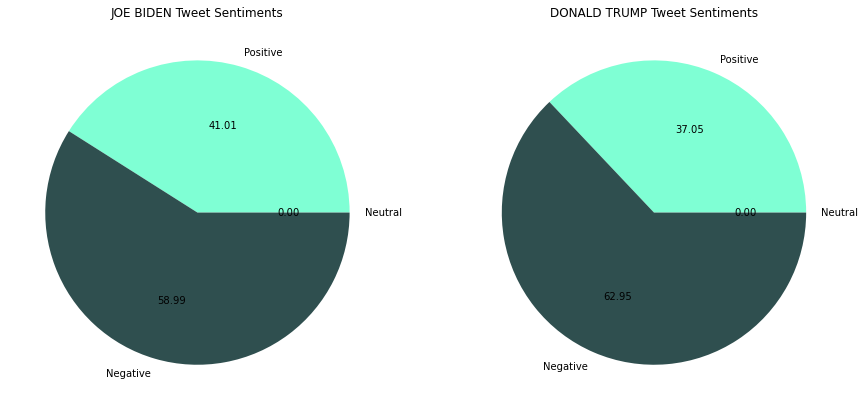

In [224]:
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.pie(vader_pie_Joe, labels=labels, colors=colors, autopct = '%.2f')
plt.subplot(1,2,1).set_title("JOE BIDEN Tweet Sentiments")
plt.subplot(1,2,2)
plt.pie(vader_pie_Trump, labels=labels, colors=colors, autopct = '%.2f')
plt.subplot(1,2,2).set_title("DONALD TRUMP Tweet Sentiments")

In [225]:
Joe_df_eng.to_csv('Joe_Biden_Vader.csv', encoding = 'utf-8')
Trump_df_eng.to_csv('Donald_Trump_Vader.csv', encoding = 'utf-8')

In [226]:
word_tokenize('my name is nothing and i am flying')

['my', 'name', 'is', 'nothing', 'and', 'i', 'am', 'flying']

In [227]:
Joe_df_eng['cleaned_text_tokenized_model'] = [nltk.word_tokenize(i) for i in Joe_df_eng['cleaned_tweets']]
# convert preprocesseed sentences to tokem=nized sentence

In [229]:
Trump_df_eng['cleaned_text_tokenized_model'] = [nltk.word_tokenize(i) for i in Trump_df_eng['cleaned_tweets']]
# convert preprocesseed sentences to tokem=nized sentence

In [230]:
Joe_df_eng.head()

,Like_count,Retweet_count,Username,Date,Tweet,lang,cleaned1,cleaned_tweets,cleaned_tweets_token,Vader_Senti,cleaned_text_tokenized_model
0,0,0,RalphLCampbell1,2020-10-30 23:59:31+00:00,Rosie Perez On Latino Vote: ‘We Have The Power...,en,rosie perez on latino vote ‘we have the power ...,rosie perez latino vote ‘ we power change outc...,"rosie, perez, latino, vote, ‘, we, power, chan...",Positive,"[rosie, perez, latino, vote, ‘, we, power, cha..."
1,0,0,masquer08er,2020-10-30 23:59:14+00:00,@goywithaploy3 @RNCResearch @MelissaTweets I s...,en,goywithaploy3 rncresearch melissatweets i stil...,goywithaploy3 rncresearch melissatweets still ...,"goywithaploy, 3, rncresearch, melissatweets, s...",Negative,"[goywithaploy3, rncresearch, melissatweets, st..."
2,4,2,SusanBChurch11,2020-10-30 23:58:17+00:00,I’m ready to see a great president! #JoeBiden...,en,i’m ready to see a great president joebiden i...,i ’ m ready see great president joebiden presi...,"i, ’, m, ready, see, great, president, joebide...",Positive,"[i, ’, m, ready, see, great, president, joebid..."
3,0,0,nkolmer,2020-10-30 23:58:12+00:00,Let’s talk abt how screwed up you @potus have ...,en,let’s talk abt how screwed up you potus have l...,let ’ s talk abt screw potus leave country con...,"let, ’, s, talk, abt, screw, potus, leave, cou...",Negative,"[let, ’, s, talk, abt, screw, potus, leave, co..."
4,0,0,SAJi74436184,2020-10-30 23:58:11+00:00,@realDonaldTrump Dear America. A quick remind...,en,realdonaldtrump dear america a quick reminder...,realdonaldtrump dear america quick reminder th...,"realdonaldtrump, dear, america, quick, reminde...",Negative,"[realdonaldtrump, dear, america, quick, remind..."


In [231]:
Trump_df_eng.head()

,Like_count,Retweet_count,Username,Date,Tweet,lang,cleaned1,cleaned_tweets,cleaned_tweets_token,Vader_Senti,cleaned_text_tokenized_model
0,1,0,DanLake87324031,2020-10-30 23:59:41+00:00,#DonaldTrump #TeamTrump Republican officials a...,en,donaldtrump teamtrump republican officials are...,donaldtrump teamtrump republican official fina...,"donaldtrump, teamtrump, republican, official, ...",Negative,"[donaldtrump, teamtrump, republican, official,..."
1,1,0,social411now,2020-10-30 23:59:13+00:00,How #DonaldTrump Plans to Overthrow #AmericanD...,en,how donaldtrump plans to overthrow americandem...,donaldtrump plan overthrow americandemocracy v...,"donaldtrump, plan, overthrow, americandemocrac...",Negative,"[donaldtrump, plan, overthrow, americandemocra..."
2,0,0,2g_shah,2020-10-30 23:59:08+00:00,"The Supreme Court has used ""Shadow Docket"" 14 ...",en,the supreme court has used shadow docket 14 ti...,supreme court use shadow docket 14 time octobe...,"supreme, court, use, shadow, docket, 14, time,...",Positive,"[supreme, court, use, shadow, docket, 14, time..."
3,0,0,JoeCool212,2020-10-30 23:58:51+00:00,@PalmerReport Stevie can SEE 👀 #VOTEHIMOUT @PO...,en,palmerreport stevie can see 👀 votehimout potus...,palmerreport stevie see 👀 votehimout potus flo...,"palmerreport, stevie, see, 👀, votehimout, potu...",Negative,"[palmerreport, stevie, see, 👀, votehimout, pot..."
4,1,0,Revivingfortune,2020-10-30 23:58:40+00:00,@realDonaldTrump Terrible week on the #StockM...,en,realdonaldtrump terrible week on the stockmar...,realdonaldtrump terrible week stockmarket dona...,"realdonaldtrump, terrible, week, stockmarket, ...",Negative,"[realdonaldtrump, terrible, week, stockmarket,..."


## MODEL BUILDING

In [233]:
from numpy import mean
from numpy import std

from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split

from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import SGDClassifier

from sklearn.svm import SVC
from sklearn.datasets import make_classification
from sklearn import metrics

from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier

from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import GaussianNB

from sklearn import linear_model

from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier


from sklearn.metrics import classification_report, f1_score, accuracy_score, confusion_matrix
from sklearn.metrics import roc_curve, auc, roc_auc_score

### Train Test Split 

In [234]:
# JOE BIDEN DATASET
X_train_Joe, X_test_Joe, y_train_Joe, y_test_Joe = train_test_split(Joe_df_eng['cleaned_tweets'],
                                                                   Joe_df_eng['Vader_Senti'], test_size=0.3, random_state=51)

In [235]:
model_Joe = Word2Vec(Joe_df_eng['cleaned_text_tokenized_model'], min_count=1)
w2v = dict(zip(model_Joe.wv.index_to_key, model_Joe.wv.vectors)) # for converting sentences to vectors from word vectors result by Word2Vec

In [239]:
class MeanEmbeddingVectorizer(object):
    def __init__(self, word2vec):
        self.word2vec = word2vec
        # if a text is empty we must return a vector of zeros of the same dimentionality as all the vectors
        self.dim = len(next(iter(word2vec.values())))
    
    def fit(self, X):
        return self
    def transform(self, X):
        return np.array([
            np.mean([self.word2vec[w] for w in words if w in self.word2vec]
                   or [np.zeros(self.dim)], axis=0)
            for words in X
        ])

In [240]:
X_train_tok_Joe = [nltk.word_tokenize(i) for i in X_train_Joe]  # for word2vec
X_test_tok_Joe = [nltk.word_tokenize(i) for i in X_test_Joe]

In [241]:
#Word2vec
#Fitting & Transforming

model_mev_Joe = MeanEmbeddingVectorizer(w2v)
X_train_vectors_w2v_Joe = model_mev_Joe.transform(X_train_tok_Joe)
X_test_vectors_w2v_Joe = model_mev_Joe.transform(X_test_tok_Joe)

In [244]:
X_test_Joe

11504    seven day go allow china regime buy oval offic...
22917    judicial watch announce file foia lawsuit dhs ...
9156     realdonaldtrump tonybobulinski interview tonig...
24266    bidenharris2020 democrat dnc harrisbiden deeps...
1753     doyouevenlif joebiden entire family vote joebi...
                               ...                        
18509    joebiden drbiden powerful speech yet i ’ m hon...
23840    fracking joebiden debate foxnews cnn msnbc fra...
8938     come one pennsylvania joebiden native pennsylv...
12750    way hardware store ephratapa lancaster lancast...
33222          can ’ t fake 👏🏽 joebiden httpstco7rbvfswewp
Name: cleaned_tweets, Length: 10277, dtype: object

Converting X_train to vectors since model can only run on numbers and not words.  
So, Fit and Transform

In [245]:
#TF-IDF
tfidf_vectorizer_Joe = TfidfVectorizer(use_idf=True)

X_train_vectors_tfidf_Joe = tfidf_vectorizer_Joe.fit_transform(X_train_Joe)  
#tfidf works on non tokenized sentences unlike word2vec

#only transform X_test i.e. not fit_transform
X_test_vectors_tfidf_Joe = tfidf_vectorizer_Joe.transform(X_test_Joe, y_train_Joe)

### SUPPORT VECTOR MACHINE 

In [247]:
#fitting the classification model using SVM (tf-idf)

svm_tfidf_Joe = SVC(probability=True, kernel='linear')
svm_tfidf_Joe.fit(X_train_vectors_tfidf_Joe, y_train_Joe)  #Model

predicted_svm_tfidf_Joe = svm_tfidf_Joe.predict(X_test_vectors_tfidf_Joe)  #predction
accuracy_svm_tfidf_Joe = svm_tfidf_Joe.score(X_test_vectors_tfidf_Joe, y_test_Joe)     #accuracy

print("Accuracy:", accuracy_svm_tfidf_Joe)
print(classification_report(y_test_Joe, predicted_svm_tfidf_Joe))
print('Confusion Matrix:', confusion_matrix(y_test_Joe, predicted_svm_tfidf_Joe))
# tried using all kernel, linear kernel gives the highest accuracy

Accuracy: 0.8816775323537998
              precision    recall  f1-score   support

    Negative       0.88      0.93      0.90      6027
    Positive       0.89      0.81      0.85      4250

    accuracy                           0.88     10277
   macro avg       0.88      0.87      0.88     10277
weighted avg       0.88      0.88      0.88     10277

Confusion Matrix: [[5601  426]
 [ 790 3460]]


In [248]:
predicted_svm_tfidf_Joe_train = svm_tfidf_Joe.predict(X_train_vectors_tfidf_Joe)
predicted_svm_tfidf_Joe_test = predicted_svm_tfidf_Joe

### NAIVE BAYES 

In [264]:
#fitting the classification model using Naive Bayes (tf-idf)

nb_tfidf_Joe = MultinomialNB()
nb_tfidf_Joe.fit(X_train_vectors_tfidf_Joe, y_train_Joe)  #Model

y_pred_Joe = nb_tfidf_Joe.predict(X_test_vectors_tfidf_Joe)  #predction
y_prob_Joe = nb_tfidf_Joe.predict_proba(X_test_vectors_tfidf_Joe)[:,1]     

print("Accuracy:", accuracy_score(y_test_Joe, y_pred_Joe))   #accuracy
print(classification_report(y_test_Joe, y_pred_Joe))
print('Confusion Matrix:', confusion_matrix(y_test_Joe, y_pred_Joe))


Accuracy: 0.7684149070740488
              precision    recall  f1-score   support

    Negative       0.73      0.96      0.83      6027
    Positive       0.90      0.50      0.64      4250

    accuracy                           0.77     10277
   macro avg       0.81      0.73      0.73     10277
weighted avg       0.80      0.77      0.75     10277

Confusion Matrix: [[5779  248]
 [2132 2118]]


### LOGISTIC REGRESSION 

In [265]:
#fitting the classification model using Logistic Regression (tf-idf)

logreg_Joe = linear_model.LogisticRegression(max_iter=300)
logreg_Joe.fit(X_train_vectors_tfidf_Joe, y_train_Joe)   #Model

y_pred_lr_Joe = logreg_Joe.predict(X_test_vectors_tfidf_Joe)   #predction

print("Accuracy:", accuracy_score(y_test_Joe, y_pred_lr_Joe))   #accuracy
print(classification_report(y_test_Joe, y_pred_lr_Joe))
print('Confusion Matrix:', confusion_matrix(y_test_Joe, y_pred_lr_Joe))


Accuracy: 0.8557944925561934
              precision    recall  f1-score   support

    Negative       0.84      0.93      0.88      6027
    Positive       0.89      0.75      0.81      4250

    accuracy                           0.86     10277
   macro avg       0.86      0.84      0.85     10277
weighted avg       0.86      0.86      0.85     10277

Confusion Matrix: [[5620  407]
 [1075 3175]]


### RANDOM FOREST 

100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [19:00<00:00, 22.82s/it]


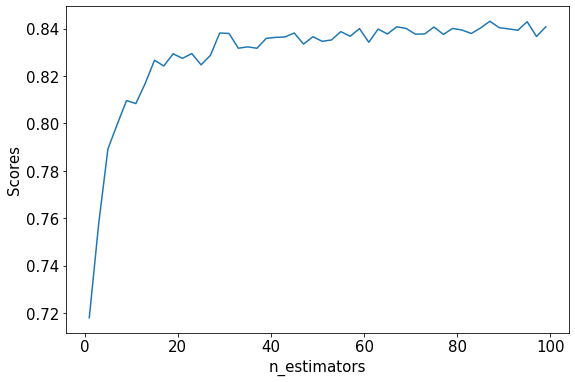

In [260]:
from tqdm import tqdm
# fitting the classfication model using RF (tf-idf):
estimator_range = []

for i in range(1, 101, 2):
    estimator_range.append(i)
    
models=[]
scores=[]

for n_estimators in tqdm(estimator_range):
    
    # Create RF Classfier
    clf_RF_Joe = RandomForestClassifier(n_estimators = n_estimators)
    clf_RF_Joe.fit(X_train_vectors_tfidf_Joe, y_train_Joe)   #model
    
    # Append the model and score to their respective list
    models.append(clf_RF_Joe)
    scores.append(accuracy_score(y_true = y_test_Joe, y_pred = clf_RF_Joe.predict(X_test_vectors_tfidf_Joe)))
    
# Generate the plot of scores against number of estimators
plt.figure(figsize=(9,6))
plt.plot(estimator_range, scores)
plt.xlabel('n_estimators', fontsize=15)
plt.ylabel('Scores', fontsize=15)
plt.tick_params(labelsize=15)
plt.show()

In [255]:
# fitting the classification model using RF (tf-idf) using best obtained n_estimators value = 93

# creating RF classifier
clf_Joe = RandomForestClassifier(n_estimators=93)

#train the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf_Joe.fit(X_train_vectors_tfidf_Joe, y_train_Joe)

# performing predicions on the test dataset
y_pred_RF_Joe = clf_Joe.predict(X_test_vectors_tfidf_Joe)

print("Accuracy:", accuracy_score(y_test_Joe, y_pred_RF_Joe))   #accuracy
print(classification_report(y_test_Joe, y_pred_RF_Joe))
print('Confusion Matrix:', confusion_matrix(y_test_Joe, y_pred_RF_Joe))

Accuracy: 0.8411987934222049
              precision    recall  f1-score   support

    Negative       0.85      0.88      0.87      6027
    Positive       0.82      0.78      0.80      4250

    accuracy                           0.84     10277
   macro avg       0.84      0.83      0.84     10277
weighted avg       0.84      0.84      0.84     10277

Confusion Matrix: [[5311  716]
 [ 916 3334]]
